# Assignment 5
## Decision Trees and Random Forests for Regression, Part 2

### About this notebook

The general description and instructions as well as questions for the work with Part 2 of the assignment (this notebook) are found in the Assignment description in Canvas!


In [1]:
# YOU DON'T HAVE TO RUN THIS IF EVERYTHING IS ALREADY INSTALLED CORRECTLY
!pip3 install --upgrade pip
!pip3 install graphviz
!pip3 install dtreeviz
!pip3 install numpy scipy

!pip3 install ordered_set

  Using cached pip-24.3.1-py3-none-any.whl.metadata (3.7 kB)
Using cached pip-24.3.1-py3-none-any.whl (1.8 MB)


ERROR: To modify pip, please run the following command:
C:\Users\joaqu\anaconda3\envs\ML\python.exe -m pip install --upgrade pip


## Step 0: Dataset(s)

First load the dataset you want to use. Ultimately, you should be working with the **California housing data**, but for quicker test runs, it might help to first start out with the **Diabetes data**. For an initial test that your implementation actually works correctly, you should use the **ConceptData**.

In [2]:
from sklearn.datasets import load_diabetes
from sklearn.datasets import fetch_california_housing
from sklearn.model_selection import train_test_split 
import matplotlib.pyplot as plt
import graphviz

import ssl
ssl._create_default_https_context = ssl._create_unverified_context

#test_case = 'concept'
test_case = 'california'
#test_case = 'diabetes'

if test_case == 'california':
    dataset = fetch_california_housing()
elif test_case == 'diabetes':
    dataset = load_diabetes()
elif test_case == 'concept':
    print("running on toy data, actual data will be loaded later")
else:
    raise ValueError('Unknown test case')



If using real data, split the set into train, validation and test sets.

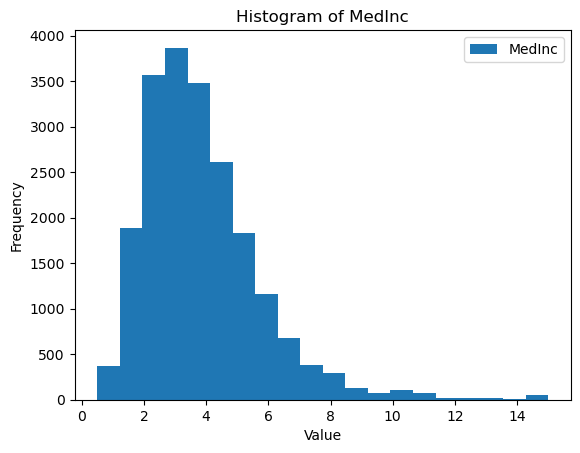

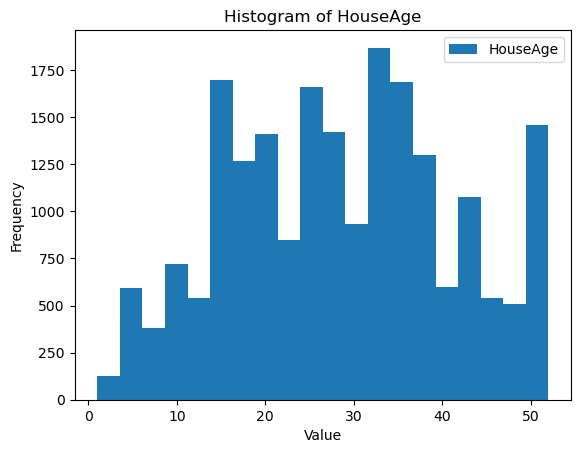

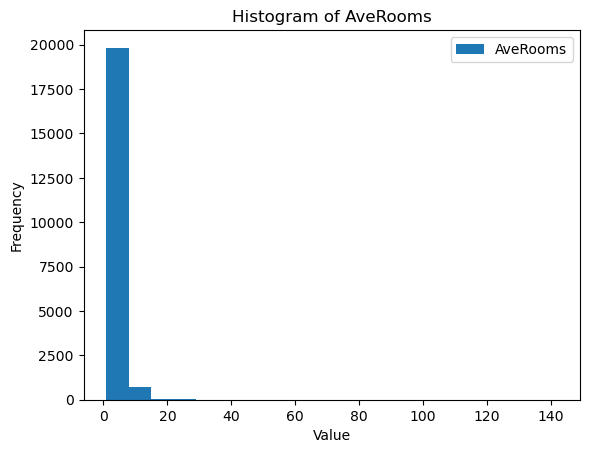

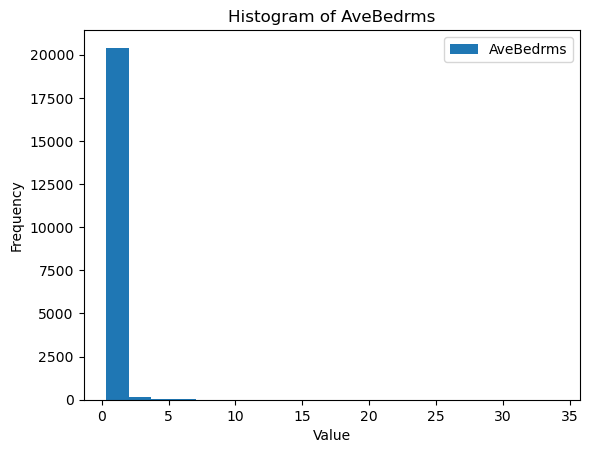

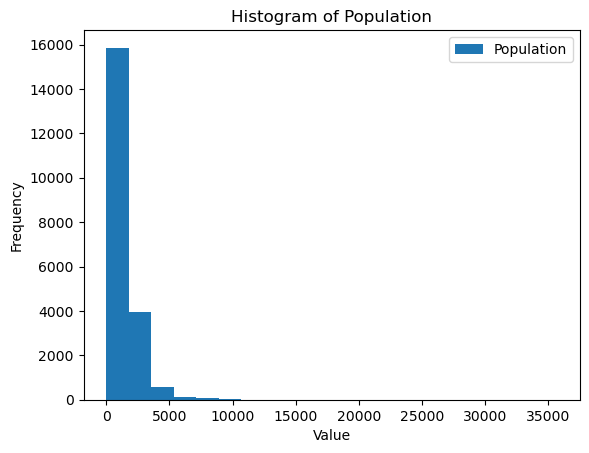

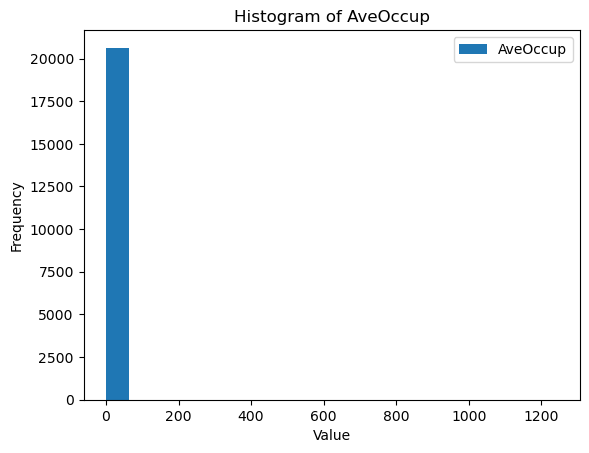

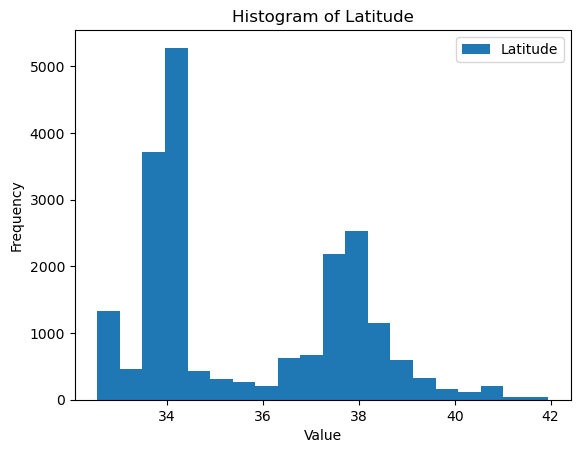

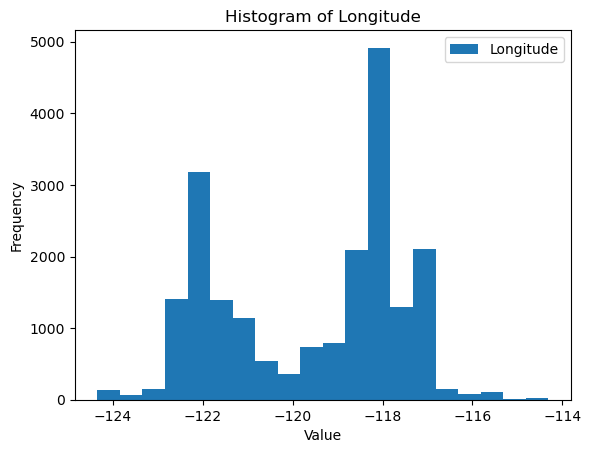

In [3]:
if (test_case == 'california') or (test_case == 'diabetes'):
    X = dataset.data
    y = dataset.target

    train_ratio = 0.70
    validation_ratio = 0.15
    test_ratio = 0.15
    
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=1 - train_ratio, random_state=0)
    X_val, X_test, y_val, y_test = train_test_split(X_test, y_test, test_size=test_ratio/(test_ratio + validation_ratio), random_state=0)

    # Visualize the distribution of the data
    for i, feature in enumerate(dataset.feature_names):
        plt.hist(X[:, i], bins=20, alpha=1, label=feature)
        plt.title(f"Histogram of {feature}")
        plt.xlabel("Value")
        plt.ylabel("Frequency")
        plt.legend()
        plt.show()
    

## Steps 1-2: Creating and evaluating an ID3-based Regression Tree

The following cells provide some framework for creating / testing your own, ID3-based, regressor. To see that your tree is constructed correctly, some prints are provided (essentially from the lecture) within the handout directory, that are created with the "ConceptData" from the lecture. 

### Step 1:
To make experiments with categorical data, you need to discretize - bin - the data (this goes both for the 'california' and the 'diabetes' cases, for the toy data - 'concept' - case, this is naturally given, note that the data are only loaded below). 
In order to have the entire data set "as is" for the binning, you can prepare a binning rule on the original data (X), that you then apply to your train and test data sets. To make sure that you do not miss any possible attribute values, use the entire set (X) again when providing the categorical values (here bin indices) to the ID3 tree.

In [4]:
from ConceptDataRegr import ConceptDataRegr
import ConceptDataRegr as cd

from sklearn.preprocessing import KBinsDiscretizer
import numpy as np

# For testing that you get the correct output from the ID3 / your score implementation, 
# you can use the "ConceptData" data set (toggle in step 0!):
if test_case == 'concept' :
    attributes, binned_X_train, y_train, binned_X_test, y_test = cd.ConceptDataRegr().get_data()
    binned_X_val = []
    y_val = []
     
else :
    # you might want to try different numbers of bins to see whether using a multivalued branching actually can 
    # improve results over binary decisions only
    
    # ΝΟΤΕ: it is NOT necessary to use the same number of bins for all parameters, e.g. [3,11,4,2,2,7,8,3]
    # could be a really good choice for the California data - or not (no idea if it is, this is just an EXAMPLE)
    
    # HINT: inspect the data set description in part 1 to find suitable numbers - there is, for example, 
    # one feature in the Diabetes data that is binary by nature, so it does not make sense to use anything 
    # else but two bins for that feature
    
    if test_case == 'california':
        bins_extra = [2,2,2,2,2,2,2,2]
        bins = [3,11,4,2,3,2,8,3]
    elif test_case == 'diabetes':
        bins_extra = [2,2,2,2,2,2,2,2,2,2]
        bins = [9,2,5,5,5,5,5,7,5,5]
        
    # here you can test to use different strategies, see the KBinsDiscretizer documentation
    # quantile as the strategy would be interesting to test, in this strategy the bins are distributed in a way 
    # that each bin has the same number of data points
    binner = KBinsDiscretizer(n_bins=bins, encode='ordinal', strategy='kmeans')
    binning_rule = binner.fit(X)
    # use the binning rule
    binned_X = binning_rule.transform(X).astype(int)
    binned_X_train = binning_rule.transform(X_train).astype(int)
    binned_X_val = binning_rule.transform(X_val).astype(int)
    binned_X_test = binning_rule.transform(X_test).astype(int)

    # create an attribute list with "conceptual" features/attributes
    # attributes = { "attr1" : {0,1,2,3,4,5,6,7,8,9,10}, "attr2" : {0,1}, ... }
    # is a dictionary where the key is the attribute name and the value is a set of possible values
    attributes = {}
    i = 0
    for attr in dataset.feature_names:
        # We basically just iterate through all the rows for each column
        # and add the unique values to the set 
        attributes[attr] = set(binned_X[:,i])
        i+=1

    binner_extra = KBinsDiscretizer(n_bins=bins_extra, encode='ordinal', strategy='kmeans')
    binning_rule_extra = binner_extra.fit(X)
    # use the binning rule
    binned_X_extra = binning_rule_extra.transform(X).astype(int)
    binned_X_train_extra = binning_rule_extra.transform(X_train).astype(int)
    binned_X_val_extra = binning_rule_extra.transform(X_val).astype(int)
    binned_X_test_extra = binning_rule_extra.transform(X_test).astype(int)
    attributes_extra = {}
    i = 0
    for attr in dataset.feature_names :
        attributes_extra[attr] = set(binned_X_extra[:,i])
        i+=1

print(attributes_extra)
print(attributes)

# In an ID3-based regression tree, binning the data is necessary because the algorithm is fundamentally designed to handle categorical attributes, not continuous values.
# Explanation: ID3 uses information gain based on entropy to split the data at each node. Entropy calculations require disrete categories to assess the purity of splits.
# Coninuous data lacks inherent categories, making it difficult to directly calculate entropy or information gain.
# THIS MAKES A LOT OF SENSE AND WAS A QUESTION I HAD IN MIND BEFORE READING THE EXPLANATION:
# In regression problems, attributes and target values are typically continous. Without binning, the algorithm would have to evaluate every possible split point, which is
# computationally infeasible for large datasets. Binning reduces the number of possible split points to a manageable number, making the algorithm feasible for large datasets.
# # It also reduces overfitting since continuous attributes can lead to overfitting if the tree grows too complex.
# Common Methods for Binning:
# Equal-width binning: Divide the range of values into bins of equal size.
# Equal-frequency binning: Ensure each bin contains approximately the same number of data points.
# Domain-specific binning: Create bins based on domain knowledge, grouping values that are logically or practically similar.
# Here we used equal width binning.

c:\Users\joaqu\anaconda3\envs\ML\lib\site-packages\sklearn\preprocessing\_discretization.py:239: FutureWarning: In version 1.5 onwards, subsample=200_000 will be used by default. Set subsample explicitly to silence this warning in the mean time. Set subsample=None to disable subsampling explicitly.
  warnings.warn(


{'MedInc': {0, 1}, 'HouseAge': {0, 1}, 'AveRooms': {0, 1}, 'AveBedrms': {0, 1}, 'Population': {0, 1}, 'AveOccup': {0, 1}, 'Latitude': {0, 1}, 'Longitude': {0, 1}}
{'MedInc': {0, 1, 2}, 'HouseAge': {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10}, 'AveRooms': {0, 1, 2, 3}, 'AveBedrms': {0, 1}, 'Population': {0, 1, 2}, 'AveOccup': {0, 1}, 'Latitude': {0, 1, 2, 3, 4, 5, 6, 7}, 'Longitude': {0, 1, 2}}


c:\Users\joaqu\anaconda3\envs\ML\lib\site-packages\sklearn\preprocessing\_discretization.py:239: FutureWarning: In version 1.5 onwards, subsample=200_000 will be used by default. Set subsample explicitly to silence this warning in the mean time. Set subsample=None to disable subsampling explicitly.
  warnings.warn(


### Step 2:
Set up and fit the tree, create the dot-data for visualisation. Fill the stubb for *id3_score* below and compare results against the sklearn implementation using different parameters for *max_depth* and *min_samples_leaf*, as well as (many) different binnings. 

Evaluate (on the **California housing data**) two different parameter settings for *max_depth* and *min_samples_leaf* each as well as *two different binnings* (where one should be a binary binning for direct comparison with the SKLearn tree model) in a structured way (e.g. produce a table with the different combinations of parameters). Compare against the **respective same parameter settings** (where possible) for regressor1 from Part 1. 
Hint: there are binnings (non-uniform such) for which the ID3 actually outperforms the CART implementation in SciKitLearn.

Do **not** try to compare to the random forest score from Part 1, that will be the next step!!!

In [5]:
# -------------------------- IMPLEMENTATION TASK BELOW THIS LINE ------------------------  
import ID3_reg

# As of now, the ID3_reg class does not provide any score-method - please replace the stubb below by
# a proper method according to the description of DecisionTreeRegressor.score() for easier 
# comparison with the scikit-learn trees!
    
# The score method returns the coefficient of determination R^2 of the prediction. It is defined as (1 - u/v),
# where u is the residual sum of squares ((y_true - y_pred) ** 2).sum() and v is the total sum of squares ((y_true - y_true.mean()) ** 2).sum().
# The best possible score is 1.0 and it can be negative (because the model can be arbitrarily worse). A constant model that always predicts the expected value of y,
# disregarding the input features, would get a R^2 score of 0.0.
def id3_score(predicted, target) :
    score = 1.0
    u = ((target - predicted)**2).sum() # residual sum of squares
    v = ((target - target.mean())**2).sum() # total sum of squares
    score = 1 - u/v
    return score

# -------------------------------------------------------------------------------------------------

# Now, set up the tree (inspect the ID3_reg class to see the different parameter options, start out with the
# "Concept Data" from the lecture)    
id3_noParams = ID3_reg.ID3RegressionTreePredictor()
id3_maxDepth = ID3_reg.ID3RegressionTreePredictor(maxDepth=1)
id3_minSamplesLeaf = ID3_reg.ID3RegressionTreePredictor(minSamplesLeaf=20)
id3_noParams_extra = ID3_reg.ID3RegressionTreePredictor()
id3_maxDepth_extra = ID3_reg.ID3RegressionTreePredictor(maxDepth=1)
id3_minSamplesLeaf_extra = ID3_reg.ID3RegressionTreePredictor(minSamplesLeaf=20)

# Note: the implementation needs both the complete dictionary over all attributes plus the list of 
# attributes (names only) that are actually to be used for the particular run of fit()
tree_noParams = id3_noParams.fit(binned_X_train, y_train, attributes, attributes.keys())
tree_noParams_extra = id3_noParams_extra.fit(binned_X_train_extra, y_train, attributes_extra, attributes_extra.keys())

tree_maxDepth = id3_maxDepth.fit(binned_X_train, y_train, attributes, attributes.keys())
tree_maxDepth_extra = id3_maxDepth_extra.fit(binned_X_train_extra, y_train, attributes_extra, attributes_extra.keys())

tree_minSamplesLeaf = id3_minSamplesLeaf.fit(binned_X_train, y_train, attributes, attributes.keys())
tree_minSamplesLeaf_extra = id3_minSamplesLeaf_extra.fit(binned_X_train_extra, y_train, attributes_extra, attributes_extra.keys())
print(tree_noParams)
# Scikit Regression Tree results:
# no params California = 0.5913806202834724
# max_depth=1 California = 0.2977964241669544
# min_samples_leaf=20 California = 0.7023197194670979

# Own implementation results:
# no params California good binning = 0.5051002325863077
# no params California bad binning = 0.35140614724235586
# max_depth=1 California good binning = 0.3948955705328486
# max_depth=1 California bad binning = 0.2853967342091067
# min_samples_leaf=20 California good binning = 0.5182573142021842
# min_samples_leaf=20 California bad binning = 0.35140614724235586

leaf, not enough samples, setting node-value = 0.0
leaf, not enough samples, setting node-value = 0.0
leaf, not enough samples, setting node-value = 0.0
leaf, not enough samples, setting node-value = 0.0
leaf, not enough samples, setting node-value = 0.0
leaf, not enough samples, setting node-value = 0.0
leaf, not enough samples, setting node-value = 0.0
leaf, not enough samples, setting node-value = 0.0
leaf, not enough samples, setting node-value = 0.0
leaf, not enough samples, setting node-value = 0.0
leaf, not enough samples, setting node-value = 0.0
leaf, not enough samples, setting node-value = 0.0
leaf, not enough samples, setting node-value = 0.0
leaf, not enough samples, setting node-value = 0.0
leaf, not enough samples, setting node-value = 0.0
leaf, not enough samples, setting node-value = 0.0
leaf, not enough samples, setting node-value = 0.0
leaf, not enough samples, setting node-value = 0.0
leaf, not enough samples, setting node-value = 0.0
leaf, not enough samples, setti

In [6]:
# Do a prediction and scoring on the binned validation and / or test data
predicted_noParams = id3_noParams.predict(binned_X_test)
predicted_maxDepth = id3_maxDepth.predict(binned_X_test)
predicted_minSamplesLeaf = id3_minSamplesLeaf.predict(binned_X_test)

predicted_noParams_extra = id3_noParams_extra.predict(binned_X_test_extra)
predicted_maxDepth_extra = id3_maxDepth_extra.predict(binned_X_test_extra)
predicted_minSamplesLeaf_extra = id3_minSamplesLeaf_extra.predict(binned_X_test_extra)

print(id3_score(predicted_noParams, y_test))
print(id3_score(predicted_maxDepth, y_test))
print(id3_score(predicted_minSamplesLeaf, y_test))

print(id3_score(predicted_noParams_extra, y_test))
print(id3_score(predicted_maxDepth_extra, y_test))
print(id3_score(predicted_minSamplesLeaf_extra, y_test))

# It honestly all depends in the dataset and the binning.
# If the binning is good, the results are better.
# It is noticeable here where for each set of parameters the results are better when the binning is good.
# The best results are achieved whn the binning is good and we choose the min_samples_leaf=20 parameter.

0.5051002325863077
0.3948955705328486
0.5182573142021842
0.35140614724235586
0.2853967342091067
0.35140614724235586


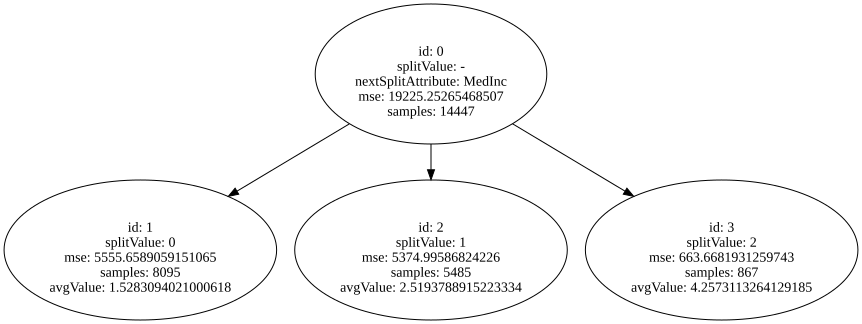

In [7]:
# visualising in the "bubble" format from the lecture
dot_data = id3_maxDepth.makeDotData().source
graph = graphviz.Source(dot_data, format="png")
graph.render(test_case+"_bubbles")
graph

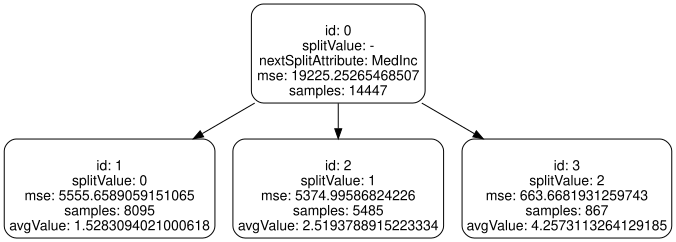

In [8]:
# printing to squares if you want a tree that looks more like those from part 1 ;-)
dot_data_pretty='digraph Tree {\n'+\
    'node [shape=box'+\
    ', style="rounded", color="black"'+\
    ', fontname="helvetica"] ;\n'+\
    'graph [ranksep=equally, splines=polyline] ;\n'+\
    'edge [fontname="helvetica"] ;\n'+\
    dot_data[9:]

graph = graphviz.Source(dot_data_pretty, format="png")
graph.render(test_case+"_pretty")
#graph.view()
graph

## Step3: Your own random forest!
Implement your own random forest (with at least N=5 trees) based on the ID3-implementation you worked with above. Use the best performing data binning from your experiments. As a reminder, the steps for the random forest creation are:
- bootstrap N new datasets from the binned *training* data you created above, sets for validation and test form already the remaining out-of-bootstrap data
- randomise the set of used attributes for each tree (clarification: do the randomisation per tree only, not for each split within the trees)
- create the N trees
- use an ensemble to get the final prediction (e.g. *weighted averaging based on the score for each tree*, for example - NOTE: remember that scores can be negative!)
- evaluate on the out-of-bootstrap data

Motivate your choices and prepare for explaining your implementation in detail!


In [9]:
# -------------------------- IMPLEMENTATION TASK BELOW THIS LINE ------------------------  
# Implement a random forest based on the ID3 implementation for a regression tree. 
# Evaluate in a fair manner (explain your choice!) against the SKLearn Random Forest you created 
# in Part 1 of the assignment.
# ...

class RandomForestID3:
    # Initialize the random forest with n_trees
    def __init__(self, n_trees):
        self.n_trees = n_trees
        self.trees = [] # list of all trees in the forest
        self.tree_scores = [] # list of scores for each tree in the forest
    
    def bootstrap_sample(self, X, y):
        # What is bootstraping?
        # 1. Sampling with replacement:
        # You randomly sample data points from the training set to create a new dataset (the boostrap sample)
        # A single data point can appear multiple times in the bootstrap sample because sampling is done with replacement.
        # 2. Diversity of trees:
        # Each tree in the Random Forest is trained on a different boostrap sample,
        # introducing variability between trees. This reduces overfitting and improves generalization.
        
        # number of samples in a boostrap sample should be the same size as the original training dataset
        n_samples = X.shape[0]
        # As mentioned, sampling is done with replacement so duplicates are allowed
        indices = np.random.choice(n_samples, n_samples, replace=True)

        # Get all the indices that were not included in the bootstrap sample
        # oob stands for out-of-boostrap
        oob_indices = list(set(range(n_samples)) - set(indices)) # list orders the indices

        # return the boostrap samples, their corresponding target labels, the out-of-boostrap samples and their corresponding target labels
        return X[indices], y[indices], X[oob_indices], y[oob_indices]

    def fit(self, X, y, attributes):
        feature_names = list(attributes.keys()) # get the feature names
        # Create n_trees trees and fit them to the boostrap samples
        for _ in range(self.n_trees):
            # Create a new tree
            tree = ID3_reg.ID3RegressionTreePredictor()

            # Create a boostrap sample
            X_boot, y_boot, X_oob, y_oob = self.bootstrap_sample(X, y)
            
            # Randomly select a subset of features for this tree
            # The default is that each tree can choose between sqrt of the total number of features
            # NO duplicates here
            max_features = int(np.sqrt(len(feature_names)))
            selected_features = np.random.choice(feature_names, max_features, replace=False)

            # Fit the tree to the boostrap sample
            # Fit method from id3
            # def fit(self, data, target, attributes, attributesToTest)
            # where data = X_sample (the boostrap sample), target = y_sample (the target labels for the boostrap sample)
            # attributes = attributes (the dictionary of all attributes), attributesToTest = selected_features (the subset of features)
            tree.fit(X_boot, y_boot, attributes, selected_features)
            self.trees.append(tree) # Add the tree to the forest

            # Calculate the tree's score on OOB data
            # Basically we use the tree we just trained to predict the target label 
            # for the out-of-bootstrap samples and compare it to the actual target labels
            prediction = tree.predict(X_oob)
            score = id3_score(prediction, y_oob)
            self.tree_scores.append(score) # Add the score to the list of tree scores
            # This list of scores will be used in the predict method for the random forest to weight the predictions

    def predict(self, X):
        tree_predictions = []
        # Make a prediction for each tree in the forest
        for tree in self.trees:
            tree_predictions.append(tree.predict(X))
        tree_predictions = np.array(tree_predictions)
        # This will become a matrix where each row represents a tree with its prediction of the n_samples

        # Normalize the tree scores (weights)
        # We filter out the scores that got negative value, as its performance is worse than random guessing
        # We then normalize the scores so that they sum up to 1
        weights = np.maximum(0, self.tree_scores) # all the trees that have a negative score are set to 0
        
        # weighted average as ensemble method
        weights = weights / weights.sum() # sum of weights becomes 1 after this step

        # Weighted average of predicitons
        # We multiply each prediction by its weight and sum them up
        # This is the final prediction of the random forest
        weighted_predictions = np.dot(weights, tree_predictions)
        return weighted_predictions


In [10]:
random_forest = RandomForestID3(n_trees=15)
random_forest.fit(binned_X_train, y_train, attributes)
predicted_random_forest = random_forest.predict(binned_X_test)
rf_score = id3_score(predicted_random_forest, y_test)
print(rf_score)

leaf, not enough samples, setting node-value = 0.0
leaf, not enough samples, setting node-value = 0.0
leaf, not enough samples, setting node-value = 0.0
leaf, not enough samples, setting node-value = 0.0
leaf, not enough samples, setting node-value = 0.0
leaf, not enough samples, setting node-value = 0.0
leaf, not enough samples, setting node-value = 0.0
leaf, not enough samples, setting node-value = 0.0
leaf, not enough samples, setting node-value = 0.0
leaf, not enough samples, setting node-value = 0.0
leaf, not enough samples, setting node-value = 0.0
leaf, not enough samples, setting node-value = 0.0
leaf, not enough samples, setting node-value = 0.0
leaf, not enough samples, setting node-value = 0.0
leaf, not enough samples, setting node-value = 0.0
leaf, not enough samples, setting node-value = 0.0
leaf, not enough samples, setting node-value = 0.0
leaf, not enough samples, setting node-value = 0.0
leaf, not enough samples, setting node-value = 0.0
leaf, not enough samples, setti

In [ ]:
# One way of visualising your forest - there might be smarter versions!
# OBS: this code assumes number_of_trees and a list with the trees called trees_in_forest
# adapt if needed!

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

trees_in_forest = random_forest.trees
number_of_trees = len(trees_in_forest)
graph = []
img_path = []

for i in range(number_of_trees):
    graph.append(graphviz.Source(trees_in_forest[i].makeDotData().source, format="png"))
    img_path.append("forest_"+test_case+str(i))
    graph[i].render(img_path[i])
    
fig, axs = plt.subplots(number_of_trees,1,figsize=(100,100)) # use plt.subplots(number_of_trees/2,2) if you want two columns
for i, axi in enumerate(axs.flat):
    axi.set_title("Tree {}".format(i))
    
    img = mpimg.imread(img_path[i]+".png")
    axi.imshow(img)
fig.tight_layout()
    